In [2]:
%matplotlib inline
import sys
sys.path.insert(0, "/Users/Matias/anaconda/lib/python2.7/site-packages/")
import igraph as ig
import matplotlib.pyplot as plt
import numpy as np
import random as rn
import iso_forest as iso
import copy

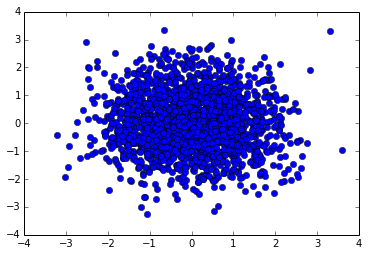

In [4]:
mean = [0, 0]
cov = [[1, 0], [0, 1]]  # diagonal covariance
Nobjs = 2000
x, y = np.random.multivariate_normal(mean, cov, Nobjs).T
#Add manual outlier
x[0]=3.3
y[0]=3.3
X=np.array([x,y]).T
plt.plot(x,y,'bo')

In [3]:
F = iso.iForest(X,ntrees=100, sample_size=256)

In [4]:
S=F.compute_paths(X_in=X)
ss=np.argsort(S)

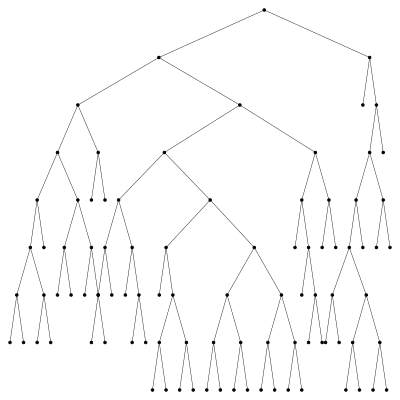

In [5]:
n_v = [0]
n_e = []
jt=0
T=F.Trees[jt]
gg,nn=iso.gen_graph(iso.all_branches(T.root,[],None,),None,0,'0_')
n_v.append(gg.vcount())
n_e.append(gg.ecount())
vstyle={}
vstyle["vertex_size"]=[2.5]*gg.vcount()
vstyle["vertex_color"]=['black']*gg.vcount()
#vstyle["vertex_label"]=g.vs['name']
vstyle["vertex_label_dist"]=2
vstyle["bbox"] = (400, 400)
vstyle["edge_color"]= [(0,0.,0.)]*gg.ecount()
vstyle["edge_width"] = [0.4]*gg.ecount()
vstyle["layout"]=gg.layout_reingold_tilford(root=[0])
vstyle["edge_curved"]=0.00
vstyle["margin"]=10
ig.plot(gg,**vstyle)

3


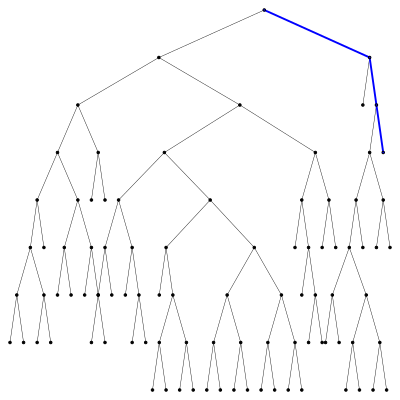

In [6]:
P=iso.PathFactor(X[ss[-1]],T)
print P.e
Gn=iso.branch2num(P.path_list)
lb=gg.get_shortest_paths('0_'+str(Gn[0]), '0_'+str(Gn[-1]))[0]
le=gg.get_eids([(lb[i],lb[i+1]) for i in xrange(len(lb)-1)])
vstyle2 = copy.deepcopy(vstyle)
for j in le: 
    vstyle2["edge_color"][j]= 'blue'
    vstyle2["edge_width"][j] = 1.9
for v in lb:
    vstyle2["vertex_color"][v]='blue'
ig.plot(gg,**vstyle2)

In [7]:
for kt in range(1,len(F.Trees)):
    T=F.Trees[kt]
    gg,nn=iso.gen_graph(iso.all_branches(T.root,[],None,),gg,0,str(kt)+'_')
    n_v.append(gg.vcount())
    n_e.append(gg.ecount())

In [8]:
vstyle={}
vstyle["vertex_size"]=[.01]*gg.vcount()
vstyle["vertex_color"]=['black']*gg.vcount()
#vstyle["vertex_label"]=g.vs['name']
vstyle["vertex_label_dist"]=2
vstyle["bbox"] = (700, 700)
vstyle["edge_color"]= [(0,0.,0.)]*gg.ecount()
vstyle["edge_width"] = [0.05]*gg.ecount()
vstyle["layout"]=gg.layout_reingold_tilford_circular(root=n_v)
vstyle["edge_curved"]=0.00
vstyle["margin"]=10
#for j in range(108,gg.ecount()):
#    vstyle["edge_color"][j]= 'green'
ig.plot(gg,**vstyle)

In [9]:
vstyle2 = copy.deepcopy(vstyle)
for kt in range(0,len(F.Trees)):
    T=F.Trees[kt]
    pre=str(kt)+'_'
    P=iso.PathFactor(X[ss[-1]],T)
    Gn=iso.branch2num(P.path_list)
    lb=gg.get_shortest_paths(pre+str(Gn[0]), pre+str(Gn[-1]))[0]
    le=gg.get_eids([(lb[i],lb[i+1]) for i in xrange(len(lb)-1)])
    for j in le: 
        vstyle2["edge_color"][j]= 'red'
        vstyle2["edge_width"][j] = 1.0
ig.plot(gg,**vstyle2)

## creating PDF

In [59]:
F = iso.iForest(X,ntrees=500, sample_size=256,limit=1000)

In [60]:
S=F.compute_paths(X_in=X)
ss=np.argsort(S)

In [61]:
values_0 = F.compute_paths_single(X[ss[0]])
values_L = F.compute_paths_single(X[ss[-1]])

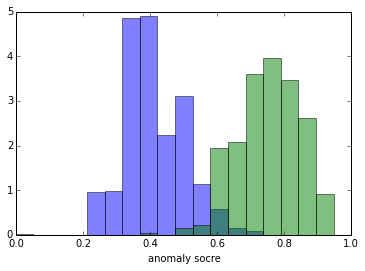

In [62]:
plt.hist(values_0,bins=np.linspace(0,1,20),normed=True,alpha=0.5)
plt.hist(values_L,bins=np.linspace(0,1,20),normed=True,alpha=0.5)
plt.xlabel('anomaly socre')

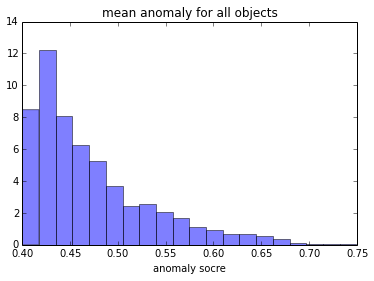

In [63]:
plt.hist(S, bins=20, normed=True, alpha=0.5)
plt.title('mean anomaly for all objects')
plt.xlabel('anomaly socre')